# Timeseries Part 1: 

In [1]:
#%matplotlib notebook 

import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib import animation, rc
rc('animation', html='jshtml')

# Cross-correlation example <a class="anchor" id="cross_corr"></a>

In [2]:
from scipy.interpolate import interp1d

# load first timeseries (Barometric pressure vs time at Duke River, Yukon)
BP_DR_num = np.loadtxt('../../Lec_Demos/06_Timeseries/BP_DR_num.txt',skiprows=1,delimiter=',')
# load second timeseries (Air temperature vs time at Duke River, Yukon)
T_DR_num  = np.loadtxt('../../Lec_Demos/06_Timeseries/T_DR_num.txt',skiprows=1,delimiter=',')

In [3]:
# Extract time vectors, downsample and set initial time to zero
tBP = BP_DR_num[:,0]      - BP_DR_num[:,0].min()
tAT = T_DR_num[:-2:12, 0] - T_DR_num[:,0].min()

In [5]:
# Jumping ahead in the course here: sue spline to interpolate barometric pressure data
# (measured every 30 min) onto air-temperature time vector (every 5 min)
BP = interp1d(tBP, BP_DR_num[:,1])(tAT)        # barometric pressure
AT = T_DR_num[::12,1][:-1]                     # air temperature 

N  = tAT.shape[0]                              # calculate length of records
print(N)

67839


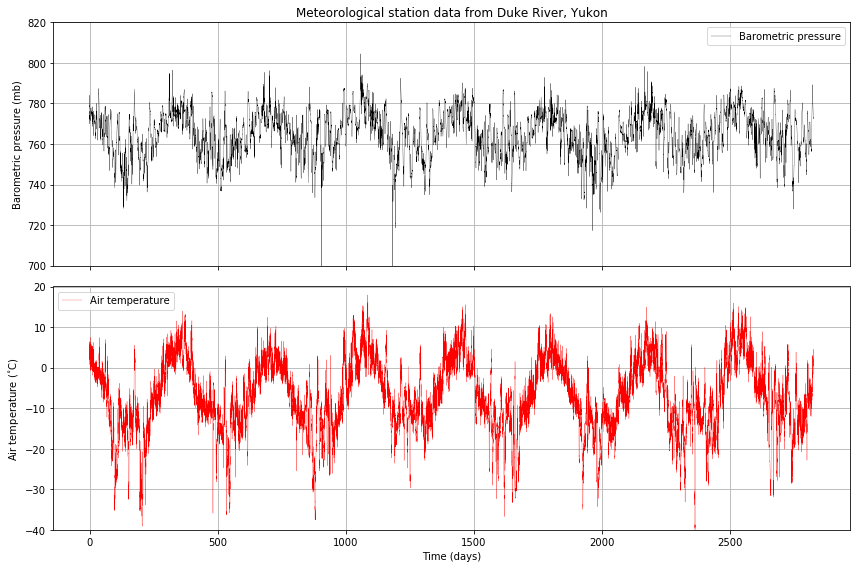

In [6]:
#Plot barometric pressure and air temperature timeseries
fig5, ax = plt.subplots(2,1,sharex=True,figsize=(12,8))

ax[0].plot(tAT,BP,'k',lw=0.25,label='Barometric pressure')
ax[0].set_ylim(700,820)
ax[0].set_ylabel('Barometric pressure (mb)')
ax[0].set_title('Meteorological station data from Duke River, Yukon')
ax[0].legend()
ax[0].grid()

ax[1].plot(tAT,AT,'r',lw=0.25,label='Air temperature')
ax[1].set_ylim(-40,20)
ax[1].set_ylabel('Air temperature ($^{\circ}$C)')
ax[1].set_xlabel('Time (days)')
ax[1].legend()
ax[1].grid()

fig5.tight_layout();

In [7]:
# Create lag vector to perform cross-correlation

lag_initial  = 0;          # set min lag to zero
lag_interval = 10;         # set lag interval in days
lag_final    = tAT[-1]/4   # set max lag relative to length of timeseries
  
lag_vec      = np.arange(lag_initial,lag_final,lag_interval)

In [8]:
# Define vector of time indices representing closest match to specified lags
values  = np.expand_dims(lag_vec, axis=-1) 
lag_idx = np.abs(tAT - values).argmin(axis=-1)

BPmean = BP.mean()          # calculate sample 1 mean
ATmean = AT.mean()          # calculate sample 2 mean

# Create an empty vector to store the cross-correlation
crosscorr = np.zeros(lag_idx.shape[0],dtype=np.float)

# Calculate the cross-correlation
for i in range(0,len(lag_idx)):
    if i == 0: 
        BP_trunc = BP.copy()             # truncate original timeseries
        AT_trunc = AT.copy()             # truncate moving timeseries
    else: 
        BP_trunc = BP[lag_idx[i]:]       # truncate original timeseries
        AT_trunc = AT[:-lag_idx[i]]      # truncate moving timeseries
        
    BP_trunc_std = np.std(BP_trunc,ddof=1) # calculate std
    AT_trunc_std = np.std(AT_trunc,ddof=1) # calculate std
    
    k            = lag_idx[i] - 1
    crosscorr[i] = np.sum((BP_trunc-BPmean)*(AT_trunc-ATmean))\
                         /(N-1-k)/BP_trunc_std/AT_trunc_std

In [9]:
# Initalize figure, set extents and plotting styles
fig, ax = plt.subplots(2,1,figsize=(12,8))

# Plot the original signal (this will stay in the background)
ax[0].set_ylim(AT.min(), AT.max())
ax[0].set_xlabel('Time increment')
ax[0].set_ylabel('Air temperature ($^{\circ}$C)')
ax[0].tick_params(axis='y', colors='tab:blue')
ax[0].yaxis.label.set_color('tab:blue')
ax[0].grid()

ax[1].set_xlim(lag_idx.min()-1,lag_idx.max()+1)

ax3 = ax[0].twinx()
ax3.plot(tAT,BP,c='tab:orange',lw=0.5,zorder=0)
ax3.set_ylim(600,900)
ax3.set_xlim(tAT[0], tAT[-1])
ax3.set_ylabel('Barometric pressure (mb)')
ax3.tick_params(axis='y', colors='tab:orange')
ax3.yaxis.label.set_color('tab:orange')

# Set the extent of the bottom panel
ax[1].plot(lag_idx[0], crosscorr[0], ls='None', marker='x', c='k')
ax[1].set_ylim(-1.1,1.1)
ax[1].set_xlim(lag_vec.min()-1,lag_vec.max()+1)
ax[1].set_ylabel('Cross-correlation')
ax[1].set_xlabel('Lag (days)')
ax[1].grid()

# Initalize empty line to be upated in animation function
line1, = ax[0].plot([], [], lw=0.5, c='tab:blue')
line2, = ax[1].plot([], [], ls='None', marker='x', c='k')
lines = [line1,line2]

def animate(i):    
    lines[0].set_data(tAT[lag_idx[i]:], AT[:-lag_idx[i]] )
    lines[1].set_data(lag_vec[:i], crosscorr[:i])
    return lines

anim = animation.FuncAnimation(fig, animate, 
                               frames=range(1,len(lag_idx)), interval=200)

plt.tight_layout()
plt.close()
anim

## Curve fitting with `scipy.optimize` 

In [10]:
import matplotlib.pyplot as plt
import scipy.optimize as optimize

Assume a curve takes the approximate form of some function: 

$$
f(x) = a \exp(-b x) + c \cos(d x)
$$

where:
  - $a$ = amplitude of $\exp$ at $x=0$
  - $b$ = decay (since it's negative) rate
  - $c$ = amplitude of periodic function 
  - $d$ = $2 \pi / T$ where $T$ is the period. 

In [12]:
# Create a synthetic function for curve-fitting demo
def func(x, a, b, c, d):
    ''' Our function to be fit'''
    return a *np.exp(-b * x) + c * np.cos(d*x)

In [13]:
# Create synthetic data and add random noise

# Create vector of x values (independent variable)
xdata = np.linspace(0, 10, 500)
# Calculate dependent variable using function above 
ytrue = func(xdata, 2.5, 1.3, 0.5, (2*np.pi / 2))

# Create random noise to be added to the synthetic data 
# Set the seed so we get the same "random" results everytime we run the cell
np.random.seed(1729)

# Calculate and add noise
y_noise = 0.2 * np.random.normal(size=xdata.size)
ydata = ytrue + y_noise

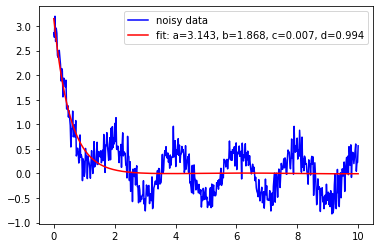

In [15]:
# Attempt curve fit and plot results

# In this case we assume a functional form for the curve fit that was used to generate the synthetic data.
popt, pcov = optimize.curve_fit(func, xdata, ydata)

fig, ax = plt.subplots()
ax.plot(xdata, ydata, 'b-', label='noisy data')
# Print parameters a,b,c,d determined from curve_fit in the legend.
# These values can be compared to the actual values of a,b,c,d used to generate the synthetic data. Are they close?
ax.plot(xdata, func(xdata, *popt), 'r-',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f, d=%5.3f' % tuple(popt))
ax.legend();

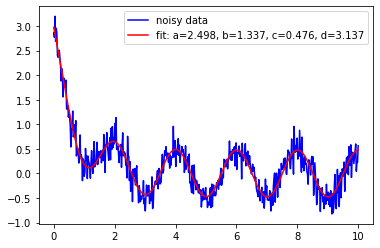

In [18]:
# Attempt curve fit again and plot results, but start with guesses for parameters a,b,c,d
popt, pcov = optimize.curve_fit(func, xdata, ydata, p0=[0,0,1,np.pi])

fig, ax = plt.subplots()
ax.plot(xdata, ydata, 'b-', label='noisy data')
ax.plot(xdata, func(xdata, *popt), 'r-',
         label='fit: a=%5.3f, b=%5.3f, c=%5.3f, d=%5.3f' % tuple(popt))
ax.legend();
# Without good 'a priori' guesses for at least some of the parameters, curve_fit has trouble fitting these data